# Install Libraries

In [15]:
#!pip install tensorboard
# !pip install efficientnet_pytorch
# !pip install seaborn

# Import Libraries
* We use mainly torch, sklearn, time, os, pandas and numpy libraries in this project.

In [25]:
from __future__ import print_function, division

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

import torch
import torch.nn as nn
from torchvision.io import read_image
from torch.utils.data import Dataset, random_split

from torchvision import datasets
from torchvision.transforms import ToTensor, Resize, ToPILImage, Lambda
import torchvision
from torchvision import transforms

import torch.nn.functional as F

import torch.optim as optim
from torch.optim import lr_scheduler

from torch.utils.data import DataLoader

from sklearn.model_selection import train_test_split

from torchvision import datasets, models, transforms

import json
from efficientnet_pytorch import EfficientNet

import time
import copy

plt.ion()   # interactive mode

# Pre Training
Expect the following tasks in this section:
* Create custom dataset class for training and validating our (food image to nutriscore label) model
* Make a train and val dataloaders with batch_size = 32 and shuffle = True
* Create an array for class names to use in visualization
* Device to run the model training and validation (GPU or CPU)
* Transforms and Data Augmentation (skipped)
* Generate Random Food Images using grid

## Custom Dataset Class

In [26]:
class HealthyFoodDataset(Dataset):
    r'''
    a custom dataset class for training and testing - food image embedding models
    
    subclasses Dataset to represent a map from keys to data samples.
    
    overwrite methods of Dataset
    __getitem__, supporting fetching data sample for a given key. 
    __len__, return the size of the dataset
    '''
    def __init__(self, annotations_file, img_dir, transform=None, target_transform=None):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform
        self.img_dim = (256, 256)

    def __len__(self):
        r'''
        returns the size of the dataset
        works with Subset function
        '''
        return len(self.img_labels)

    def __getitem__(self, idx):
        r'''
        returns pair of (input, label) given index
        '''
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, 0])
        image = Image.open(img_path) 
        image = Resize(size=(256, 256))(image)
        image = ToTensor()(image)
        image = image.numpy()
        label = self.img_labels.iloc[idx, 1]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label
    
    def get_image_filename(self, idx):
        r'''
        returns the image filename given index
        '''
        return self.img_labels.iloc[idx, 0]

## Dataset Creation
* Initially used various transforms on images of dataset but they did not help the training much, so omitted

In [27]:
annotations_file = r'/p/cs298/llico/image_to_nutriscore.csv'
img_dir = r'/p/cs298/llico/FoodImages/'
dataset = HealthyFoodDataset(annotations_file, img_dir)
# target_transform=Lambda(lambda y: torch.zeros(5, dtype=torch.float).scatter_(0, torch.tensor(y), value=1)))

## Dataloaders Creation
* For resnet50, we used batch_size = 64.
* For other models, we use only batch_size = 32 since GPU memory is exceeded for a greater batch size.
* We create a train and val data loaders independent of the model so to keep in consistent.

In [28]:
# Split dataset into train and validation (90% train and 10% val)
# Use Subset method to seperate train and val datasets
train_indices, val_indices = train_test_split(list(range(len(dataset))), test_size=0.1, stratify=dataset.img_labels['NutriScore'])
train_dataset = torch.utils.data.Subset(dataset, train_indices)
val_dataset = torch.utils.data.Subset(dataset, val_indices)

# Create DataLoaders - train_dataloader and val_dataloader
# We use 32 as batch size and sometimes 64 if it fits in GPU
train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(val_dataset, batch_size=32, shuffle=True)
dataloaders = {'train': train_dataloader, 'val': val_dataloader}

# Dict mapping for dataset sizes of train and val
dataset_sizes = {'train': len(train_dataset), 'val': len(val_dataset)}

# Map from class label to nutriscore label (0 -> A, 1 -> B, 2 -> C, 3 -> D, 4 -> E)
class_names = np.array(['A', 'B', 'C', 'D', 'E'])

# Device to run the training and validation. Prefer GPU if available else CPU
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

## Data Transforms and Augmentation
* We thought of using these transforms and augmentation but we already trained some models by then so to keep it consistent for other models we did not use it.

In [6]:
# data_transforms = {
#     'train': transforms.Compose([
#         transforms.RandomResizedCrop(224),
#         transforms.RandomHorizontalFlip(),
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ]),
#     'val': transforms.Compose([
#         transforms.Resize(256),
#         transforms.CenterCrop(224),
#         transforms.ToTensor(),
#         transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
#     ]),
# }

## Generate batch and show image grid

In [29]:
def matplotlib_imshow(img, one_channel=False):
    r'''
    show image using matplotlib
    '''
    if one_channel:
        img = img.mean(dim=0)
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    if one_channel:
        plt.imshow(npimg, cmap="Greys")
    else:
        plt.imshow(np.transpose(npimg, (1, 2, 0)))

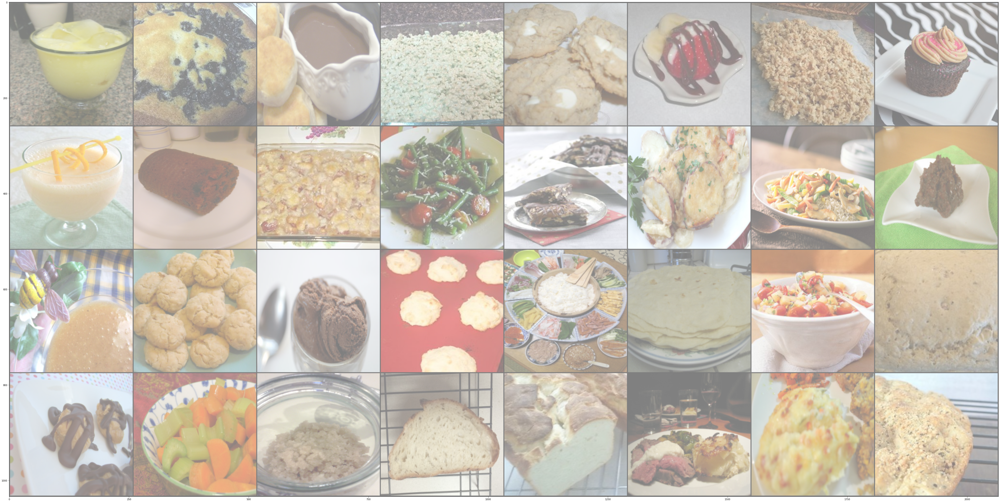

In [30]:
# Get a batch from val dataloader to make image grid
train_features, train_labels = iter(train_dataloader).next()
# img = train_features[0].squeeze()
# label = train_labels[0]

# create grid of images
img_grid = torchvision.utils.make_grid(train_features)
plt.rcParams['figure.figsize'] = [80, 40]

# show image grid
matplotlib_imshow(img_grid, one_channel=False)

## Initialize Tensorboard SummaryWriter
* writer instance will be used to send scalars, embeddings, etc to hfm_experiment runs

In [10]:
from torch.utils.tensorboard import SummaryWriter

# default `log_dir` is "runs" - we'll be more specific here
writer = SummaryWriter('runs/hfm_experiment_final')

writer.add_image('food images grid 1', img_grid)

# Model Training

## train_model
The train_model function handles the training and validation of a given model. As input, it takes a PyTorch model, a dictionary of dataloaders, a loss function, an optimizer, a specified number of epochs to train and validate. 

* Runs a model for num_epochs
* Logs the following training statistics to tensorboard:
    * After each batch, running loss is written to tensorboard
    * After each epoch, epoch loss and accuracies are written to tensorboard
* After every epoch save the model to model_{model_name}_latest.pth
* Save the best model to model_{model_name}_best.pth 
* Save the top prediction along with its probability viz to tensorboard

In [31]:
def train_model(model, criterion, optimizer, scheduler, num_epochs=25, model_name=''):
    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    for epoch in range(num_epochs):
        print('Epoch {}/{}'.format(epoch, num_epochs - 1))
        print('-' * 20)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            running_loss = 0.0
            running_corrects = 0

            # Iterate over data.
            for batch_idx, (inputs, labels) in enumerate(dataloaders[phase]):
                # inputs and labels have to be on same device as model
                # so we send inputs, labels to device
                inputs = inputs.to(device)
                labels = labels.to(device)
                
                # for viz an image grid for each batch
                img_grid = torchvision.utils.make_grid(inputs)
                # zero the parameter gradients
                optimizer.zero_grad()

                # forward
                # track history if only in train
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                
                # batch scalars for writing to tensorboard
                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                
                class_labels = [class_names[label] for label in preds]
                
                if phase == 'train':
                    writer.add_scalar("Running Loss", loss, global_step=batch_idx)
                                    
            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / dataset_sizes[phase]
            epoch_acc = running_corrects.double() / dataset_sizes[phase]

            print('{} Loss: {:.4f} Acc: {:.4f}'.format(phase, epoch_loss, epoch_acc))
            
            if phase=='train':
                writer.add_scalar(' train epoch loss', epoch_loss, epoch)
                writer.add_scalar('train epoch acc', epoch_acc, epoch)
            if phase=='val':
                writer.add_scalar('val epoch loss', epoch_loss, epoch)
                writer.add_scalar('val epoch acc', epoch_acc, epoch)

            
            # deep copy the model and store as model_best.pth
            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
                torch.save(best_model_wts,'model_{}_{}'.format(model_name, 'best.pth'))
        
        torch.save(model.state_dict(),'model_{}_{}'.format(model_name, 'latest.pth'))
        
    time_elapsed = time.time() - since
    print('Training complete in {:.0f}m {:.0f}s'.format(
        time_elapsed // 60, time_elapsed % 60))
    print('Best val Acc: {:4f}'.format(best_acc))

    # load best model weights
    model.load_state_dict(best_model_wts)
    return model

## Helper methods
* visualize_model to show multiple images along with its predictions
* plot_classes_preds to plot top classes along with correct/incorrect predictions

In [32]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(iter(train_dataloader)):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title('predicted: {}'.format(class_names[preds[j]]))
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)
        
        
def images_to_probs(net, images):
    '''
    Generates predictions and corresponding probabilities from a trained
    network and a list of images
    '''
    output = net(images)
    # convert output probabilities to predicted class
    _, preds_tensor = torch.max(output, 1)
    preds = np.squeeze(preds_tensor.numpy())
    return preds, [F.softmax(el, dim=0)[i].item() for i, el in zip(preds, output)]


def plot_classes_preds(net, images, labels):
    '''
    Generates matplotlib Figure using a trained network, along with images
    and labels from a batch, that shows the network's top prediction along
    with its probability, alongside the actual label, coloring this
    information based on whether the prediction was correct or not.
    Uses the "images_to_probs" function.
    '''
    preds, probs = images_to_probs(net, images)
    # plot the images in the batch, along with predicted and true labels
    fig = plt.figure(figsize=(12, 48))
    for idx in np.arange(4):
        ax = fig.add_subplot(1, 4, idx+1, xticks=[], yticks=[])
        matplotlib_imshow(images[idx], one_channel=True)
        ax.set_title("{0}, {1:.1f}%\n(label: {2})".format(
            classes[preds[idx]],
            probs[idx] * 100.0,
            classes[labels[idx]]),
                    color=("green" if preds[idx]==labels[idx].item() else "red"))
    return fig

## Get Model
* We use this model to get one of the four models.
* load_best=True will load the best state saved during training at state_dict_path
* If restarting the finetuning of a pretrained model, use load_best=False
* We have 4 models:
    * resnet50
    * resnet101
    * densenet121
    * efficientnet-b2
* In this method, we do not freeze parameters and return model for transfer learning.
* We froze the conv layers of resnet50 in the beginning and later used the weights from frozen network to train unfrozen network. For other models, we use the default unfrozen networks to do finetuning.

In [33]:
def get_model(model_name='resnet50', load_best=False, state_dict_path='Resnet50/model_resnet50_best.pth'):
    
    if model_name=='resnet50':
        model_conv = torchvision.models.resnet50(pretrained=True)
        num_ftrs = model_conv.fc.in_features
        model_conv.fc = nn.Linear(num_ftrs, 5)
        model_conv.eval()
        if load_best:
            model_conv.load_state_dict(torch.load(state_dict_path))
            model_conv.eval()
            return model_conv
        return model_conv
    
    elif model_name=='resnet101':
        model_conv = torchvision.models.resnet101(pretrained=True)
        num_ftrs = model_conv.fc.in_features
        model_conv.fc = nn.Linear(num_ftrs, 5)
        model_conv.eval()
        if load_best:
            model_conv.load_state_dict(torch.load(state_dict_path))
            model_conv.eval()
            return model_conv
        return model_conv
    
    elif model_name=='densenet121':
        model_dn = torchvision.models.densenet121(pretrained=True)    
        num_ftrs = model_dn.classifier.in_features
        model_dn.classifier = nn.Linear(num_ftrs, 5)
        model_dn.eval()
        if load_best:
            model_dn.load_state_dict(torch.load(state_dict_path))
            model_dn.eval()
            return model_dn
        return model_dn
    
    elif model_name=='efficientnet-b2':
        model_en = EfficientNet.from_pretrained('efficientnet-b2', num_classes=5)
        model_en.eval()
        if load_best:
            model_en.load_state_dict(torch.load(state_dict_path))
            model_en.eval()
            return model_en
        return model_en
    
    else :
        return None

Load the appropriate directory of best models.

In [116]:
state_dict_path = {
    'resnet50':'Resnet50/model_resnet50_best.pth',
    'resnet101':'Resnet101/model_resnet101_best.pth',
    'efficientnet-b2':'Efficienet/model_en_best.pth',
    'densenet121':'Densenet/model_dn_best.pth'
}

model_name = 'resnet50'
model = get_model(model_name, load_best=True, state_dict_path=state_dict_path[model_name])

In [117]:
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Define the criterion, optimizer and lr scheduler

In [118]:
criterion = nn.CrossEntropyLoss()

# SGD optimizer on all the parameters of model 
# if freezing layers use model.fc.parameters()
optimizer_conv = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

## Train the model
* First send the model to GPU or device
* Second call the train_model from before with above training settings and num_epochs.

In [13]:
# Training part of the models

# Send the model to device
model = model.to(device)
model = train_model(model, criterion, optimizer_conv, exp_lr_scheduler, num_epochs=100)

# Model Evaluation
* Here, we just evaluate the model by printing:
    * classification report
    * confusion matrix
* One important detail is we send model to cpu right after running on gpu to clear gpu memory.

In [ ]:
model = model.to(device)

In [43]:
def evaluate_model(model_conv, phase='val'):
    
    running_loss = 0.0
    running_corrects = 0.0
    predictions=[]
    actuals=[]

    for batch_idx, (inputs, labels) in enumerate(dataloaders[phase]):
        inputs = inputs.to(device)
        labels = labels.to(device)

        with torch.set_grad_enabled(False):
            outputs = model_conv(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            predictions.append(preds.cpu().numpy())
            actuals.append(labels.cpu().numpy())
        
    return predictions, actuals

In [44]:
predictions, actuals = evaluate_model(model)

In [45]:
model = model.to('cpu')

In [46]:
actuals = np.concatenate(actuals)
predictions = np.concatenate(predictions)

In [47]:
from sklearn.metrics import classification_report, confusion_matrix, plot_confusion_matrix

report = classification_report(y_true=actuals, y_pred=predictions)
print(report)

              precision    recall  f1-score   support

           0       0.95      0.97      0.96      1389
           1       0.96      0.91      0.94       857
           2       0.94      0.95      0.95      1620
           3       0.95      0.94      0.95       984
           4       0.96      0.92      0.94       114

    accuracy                           0.95      4964
   macro avg       0.95      0.94      0.95      4964
weighted avg       0.95      0.95      0.95      4964



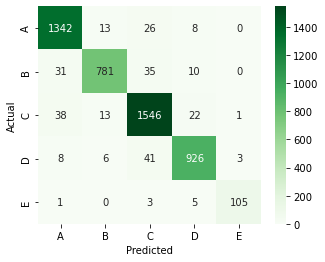

In [48]:
# Plot confusion matrix
import seaborn as sns
array = confusion_matrix(actuals, predictions)
df = pd.DataFrame(array, index=['A', 'B','C', 'D', 'E'], columns=['A', 'B','C', 'D', 'E'])

plt.figure(figsize=(5, 4))
sns.heatmap(df, annot=True, cmap='Greens', fmt='g')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Embedding Projections and KNN

* In this section, we take the last layer embeddings of the models for all training images.
* Run a KNN with n_neighbors=24 on these embeddings of training images
* Get knn embeddings, corresponding images and labels for a batch of val dataset
* Return these nearest images based on sorted labels.
* Plot the nearest images in the sorted order of labels.
* Get the filenames of these nearest images 
* Return the recipes of these imagefilenames

In [119]:
model = model.to('cpu')
model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

## Embed train images
* Here we get embeddings model without the last layer of the model.
* Use this embeddings model to get projections of all the training images
* Return the embeddings model, the train image embeddings, and the train labels

In [120]:
def embed_train_images(model):
    
    embeddings_model = torch.nn.Sequential(*(list(model.children())[:-1]))
    embeddings_model = embeddings_model.to(device)
    embeddings_model.eval()

    embeddings = []
    actuals = []

    for idx, (inputs, labels) in enumerate(train_dataset):
        inputs = torch.unsqueeze(torch.tensor(inputs), 0)
        labels = torch.unsqueeze(torch.tensor(labels), 0)
        inputs = inputs.to(device)
        labels = labels.to(device)
        with torch.no_grad():
            embeds = embeddings_model(inputs)
            embeddings.append(embeds.reshape(embeds.shape[0], -1).cpu().numpy())
            actuals.append(labels.cpu().numpy())
    embeddings_model = embeddings_model.to('cpu')
    
    return embeddings_model, np.concatenate(embeddings), np.concatenate(actuals)

In [121]:
embeddings_model, embeddings1, actuals1 = embed_train_images(model)
# actuals1 = np.concatenate(actuals)
# embeddings1 = np.concatenate(embeddings)

In [262]:
torch.save(embeddings_model.state_dict(), 'embeddings_model_{}_latest.pth'.format(model_name))

## KNN classifier
* We train KNN classifier on the embeddings with nearest neighbors of 24
* Get the 24 nearest neighbors of a test batch

In [122]:
X, y = embeddings1, actuals1

In [123]:
from sklearn.neighbors import KNeighborsClassifier
neigh = KNeighborsClassifier(n_neighbors=24)
neigh.fit(X, y)

KNeighborsClassifier(n_neighbors=24)

In [175]:
def knn_on_batch(embeddings_model, neigh, inputs, labels, n_neighbors=24):
    embeddings_model = embeddings_model.to('cpu')
    with torch.no_grad():
        embeds = embeddings_model(inputs)
        X_query = embeds.reshape(embeds.shape[0], -1).numpy()
        y_query = labels.numpy()
        
    knn_indices = neigh.kneighbors(X_query, n_neighbors)
    return knn_indices[1]

## Test KNN on val batch

In [213]:
inputs, labels = iter(dataloaders['val']).next()
knn_indices = knn_on_batch(embeddings_model, neigh, inputs, labels, n_neighbors=24)

In [238]:
ind_to_train_indices = {ind:train_indices[ind] for ind in range(len(train_indices))}

In [241]:
idx = np.random.randint(len(knn_indices))
nn_imgs = []
nn_labels = []
nn_img_fnames = []

for i in range(24):
    nn_imgs.append(train_dataset[knn_indices[idx][i]][0])
    nn_labels.append(train_dataset[knn_indices[idx][i]][1])
    nn_img_fnames.append(dataset.get_image_filename(ind_to_train_indices[knn_indices[idx][i]]))
    
tn_nn_imgs = torch.tensor(nn_imgs)

## Sample query Image

A


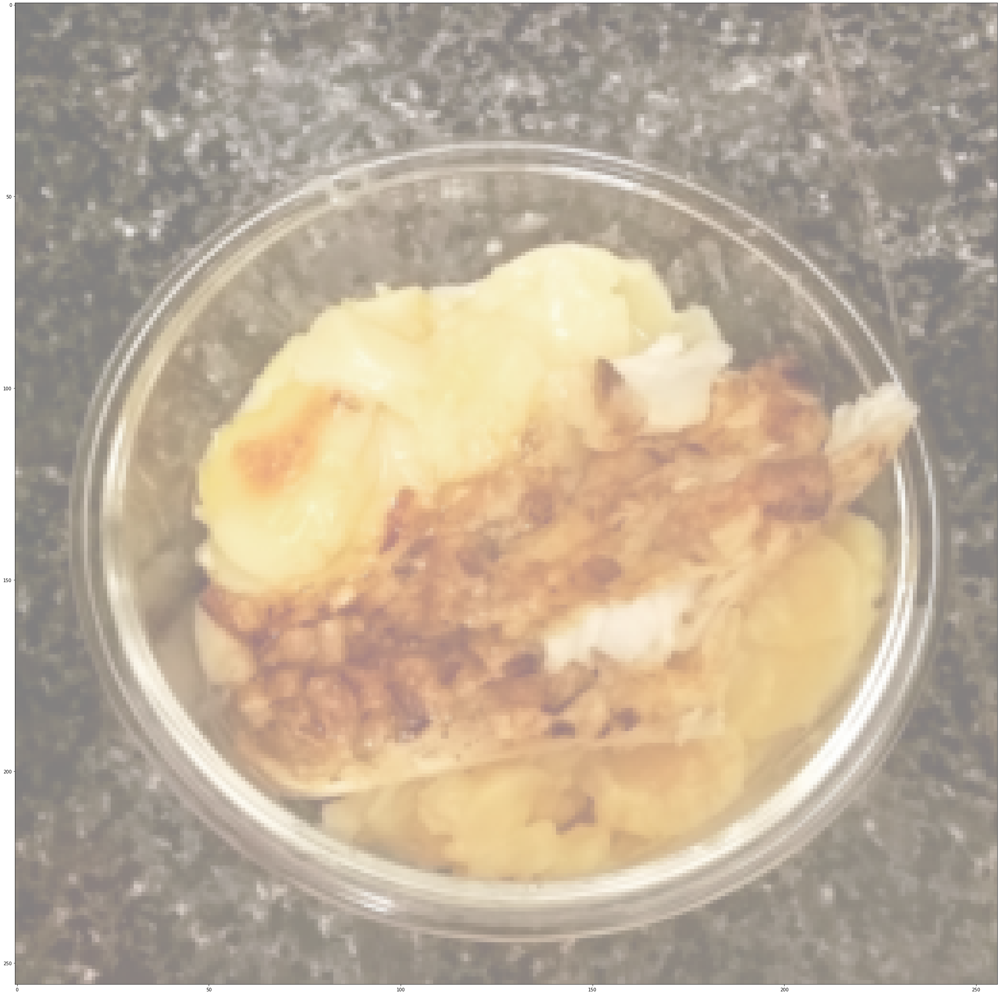

In [242]:
img = inputs[idx].squeeze()
label = labels[idx]
matplotlib_imshow(img)
print(class_names[label])

In [216]:
# img_grid = torchvision.utils.make_grid(tn_nn_imgs)
# plt.rcParams['figure.figsize'] = [60, 40]

# # show images
# matplotlib_imshow(img_grid, one_channel=False)
# print([class_names[l] for l in nn_labels])

## Output Nearest Images
* 24 nearest food images in order of their nutriscore labels
* Print the labels of each of those food images

['A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'A', 'C']


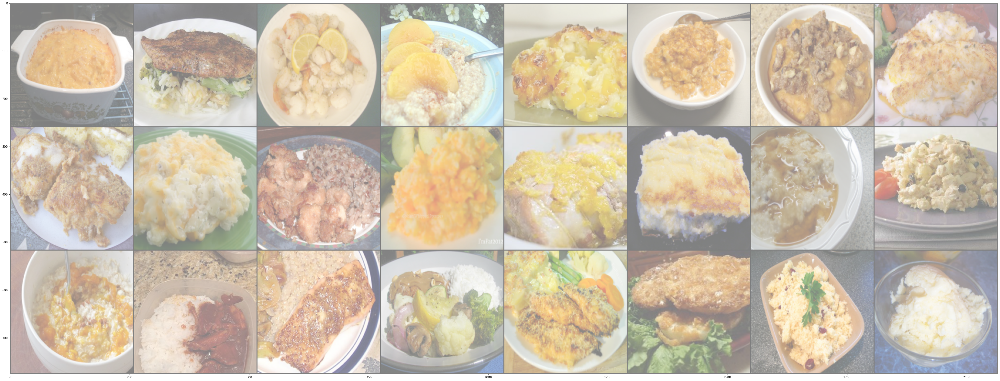

In [243]:
tn_nn_imgs1 = tn_nn_imgs[np.argsort(nn_labels)]

img_grid = torchvision.utils.make_grid(tn_nn_imgs1)
plt.rcParams['figure.figsize'] = [60, 40]

# show images
matplotlib_imshow(img_grid, one_channel=False)
print([class_names[l] for l in np.sort(nn_labels)])

## Nearest Images to Recipes
* In this, we use the nearest images from above to get recipes. 
* We take image filenames from above, order them by labels.
* Use the image filenames to map to recipes with help of id_to_recipe and image_to_id methods.

In [223]:
import pickle

with open('id_to_recipe.pickle', 'rb') as handle:
    id_to_recipe = pickle.load(handle)

with open('image_to_id.pickle', 'rb') as handle:
    image_to_id = pickle.load(handle)

In [263]:
def images_to_recipes(nn_img_fnames, nn_labels):
    sorted_nn_img_fnames = np.array(nn_img_fnames)[np.argsort(nn_labels)]

    recipes = []
    for img_fname in sorted_nn_img_fnames:
        recipe_id = image_to_id.get(img_fname, 'None')
        if recipe_id is not None:
            recipe = id_to_recipe[recipe_id]
            recipes.append(recipe)    
    return recipes

In [265]:
recipes = images_to_recipes(nn_img_fnames, nn_labels)
print(recipes[idx])

{'ingredients': [{'text': 'spices, garlic powder'}, {'text': 'spices, pepper, black'}, {'text': 'salt, table'}, {'text': 'mustard, prepared, yellow'}, {'text': 'spices, chili powder'}, {'text': 'spices, cumin seed'}, {'text': 'sugars, brown'}, {'text': 'spices, paprika'}, {'text': 'spices, oregano, dried'}], 'instructions': [{'text': 'In a small, nonporous bowl, combine the garlic powder, ground black pepper, salt, mustard powder, chili powder, cumin, brown sugar, paprika and oregano.'}, {'text': 'Mix well and apply to meat.'}], 'quantity': [{'text': '1'}, {'text': '2'}, {'text': '1'}, {'text': '1'}, {'text': '1'}, {'text': '1'}, {'text': '1'}, {'text': '4'}, {'text': '1/2'}], 'title': "Johnny's Spice Rub", 'unit': [{'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'tablespoon'}, {'text': 'teaspoon'}]}


In [259]:
# sorted_nn_img_fnames = np.array(nn_img_fnames)[np.argsort(nn_labels)]

# recipes = []
# for img_fname in sorted_nn_img_fnames:
#     recipe_id = image_to_id.get(img_fname, 'None')
#     if recipe_id is not None:
#         recipe = id_to_recipe[recipe_id]
#         recipes.append(recipe)    

# Embedding Projector of last layer
* This is used for embeddings projector feature in tensorboard
* It plots the food image embeddings in 3D using PCA, UMAP and TSNE
* We will include one such output from a particular angle in the report

In [17]:
def embedding_projector(model):
    embeddings_model = torch.nn.Sequential(*(list(model.children())[:-1]))
    model.eval() 
    for batch_idx, (inputs, labels) in enumerate(dataloaders['train']):
        inputs = inputs.to(device)
        labels = labels.to(device)

        with torch.set_grad_enabled(False):
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            
        class_labels = [class_names[label] for label in preds]
        
        embeddings = embeddings_model(inputs)
        
        if batch_idx%50 == 0:
            writer.add_embedding(
                embeddings.reshape(embeddings.shape[0], -1),
                metadata=class_labels,
                label_img=inputs,
                global_step=batch_idx)
                    
    model.load_state_dict(best_model_wts)
    return model

In [104]:
# model_ft = torchvision.models.resnet50(pretrained=True)
# num_ftrs = model_ft.fc.in_features
# model_ft.fc = nn.Linear(num_ftrs, 5)
# model_ft.load_state_dict(torch.load('model_best.pth'))
# # newmodel = torch.nn.Sequential(*(list(model_ft.children())[:-1]))
# # model_ft = model_ft.to(device)
model = model.to(device)
embedding_projector(model)

# Misc Commands and Test Space

In [ ]:
!python -m tensorboard.main --logdir=runs

TensorFlow installation not found - running with reduced feature set.
/u/llico/.local/lib/python3.6/site-packages/tensorboard_data_server/bin/server: /lib64/libc.so.6: version `GLIBC_2.18' not found (required by /u/llico/.local/lib/python3.6/site-packages/tensorboard_data_server/bin/server)
Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.7.0 at http://localhost:6006/ (Press CTRL+C to quit)
W1130 18:56:11.467352 139951734208256 plugin_event_multiplexer.py:259] Deleting accumulator 'hfm_experiment1'


In [22]:
!jupyter nbconvert --to script 'Healthy_food_model_final.ipynb'

[NbConvertApp] Converting notebook Healthy_food_model_final.ipynb to script
[NbConvertApp] Writing 11607 bytes to Healthy_food_model_final.py
